# Clusterização - Matemática Computacional

## 2. Importando as bibliotecas e as funções

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MiniBatchKMeans
from sklearn import metrics

sns.set_theme(style="ticks")

### Criando versão nativa do Mini Batch K-Means

#### Algoritmo do Mini-Batch K-Means

1. **Entrada**: $X \in \Re^{d,N}$, número de clusters K, tamanho do batch M, número máximo de iterações T.

2. Inicialize os centróides $w_1, w_2, ..., w_k \in \Re^d$ aleatoriamente.

4. **for i=1 to T do**:

    1. $X_m \leftarrow$ aleatoriamente pega M amostras de X.
    
    5. **for $x \in X_m$ do**
    
        $d[x] \leftarrow J(K,x)$ $ \qquad \triangleright$ encontra o centroide do mais proximo de x
    
    6. **end for**

    7. **for $x \in X_m$ do**

        $k \leftarrow d[x]$

        $n_{k^*} \leftarrow n_k + 1$

        $\gamma \leftarrow \frac{1}{n_{k^*}}$

        $w_{k^*} \leftarrow w_{k} + \gamma ( x_i - w_k )$

    8. **end for** 

9. **end for**

8. **Saída**: Os centróides finais dos clusters após a convergência.

In [24]:
class MiniBatchKMeansNative:
    def __init__(self, n_clusters, max_iter=100, batch_size=100, learning_rate=0.01, initial_clusters=None):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.initial_clusters = initial_clusters

    def initialize_centroids(self, X):
        if self.initial_clusters is not None:
            return self.initial_clusters, np.zeros(self.n_clusters, dtype=int)
        indices = np.random.choice(X.shape[0], size=self.n_clusters, replace=False)
        clusterCounts = np.zeros(self.n_clusters, dtype=int)
        return X[indices], clusterCounts

    def find_closest_centroids(self, X, centroids):
        distances = np.zeros((self.n_clusters, X.shape[0]))
        for i in range(self.n_clusters):
            distances[i] = self.compute_distance(X, centroids[i])
        return np.argmin(distances, axis=0)

    def compute_distance(self, X, centroid):
        return np.linalg.norm(X - centroid, axis=1)

    def update_centroids(self, XM, XM_indices, d, centroids, clusterCounts):
        for i in range(len(XM)):
            clusterCounts[d[i]] += 1
            learningRate = 1 / clusterCounts[d[i]]
            centroids[d[i]] = centroids[d[i]] + learningRate * (XM[i] - centroids[d[i]])

    def select_random_samples(self, X):
        indices = np.random.choice(X.shape[0], size=self.batch_size, replace=False)
        random_samples = X[indices]
        return indices, random_samples

    def fit(self, X):
        centroids, clusterCounts = self.initialize_centroids(X)
        n_samples = X.shape[0]

        if self.batch_size > n_samples:
            self.batch_size = n_samples

        for _ in range(self.max_iter):
            XM_indices, XM = self.select_random_samples(X)
            d = self.find_closest_centroids(XM, centroids)
            self.update_centroids(XM, XM_indices, d, centroids, clusterCounts)

        self.centroids = centroids

    def predict(self, X):
        return self.find_closest_centroids(X, self.centroids)

## 3.?. Análise do Mini Batch K-Means do Scikit-Learn

### 3.1. Funções para analisar as métricas e a diferença dos gráficos

In [25]:
import random

def generate_points(n, x_min, x_max, y_min, y_max):
    points = []
    for _ in range(n):
        x = random.uniform(x_min, x_max)
        y = random.uniform(y_min, y_max)
        point = (x, y)
        points.append(point)
    return points

def plot_clustering(tabela, n):
    df = pd.read_csv(f"./data/exercises/{tabela}.csv")
    centroids = np.array(generate_points(n, df["x"].min(), df["x"].max(), df["y"].min(), df["y"].max()))
    clustering1 = MiniBatchKMeans(n_clusters=n, init=centroids)
    clustering2 = MiniBatchKMeansNative(n_clusters=n, initial_clusters=centroids)

    i=0
    for clustering in [clustering1,clustering2]:
        i+=1
        clustering.fit(df[["x", "y"]].to_numpy())
        labels = clustering.predict(df[["x", "y"]].to_numpy())
        df[f'cluster{i}'] = labels

    print("Silhouette:")
    print("Color:", metrics.silhouette_score(df[["x", "y"]].to_numpy(), df["color"], metric="euclidean"))
    print("Cluster Sklearn:", metrics.silhouette_score(df[["x", "y"]].to_numpy(), df["cluster1"], metric="euclidean"))
    print("Cluster nativo", metrics.silhouette_score(df[["x", "y"]].to_numpy(), df["cluster2"], metric="euclidean"))
    print("Davies-Bouldin:")
    print("Color:", metrics.davies_bouldin_score(df[["x", "y"]].to_numpy(), df["color"]))
    print("Cluster Sklearn:", metrics.davies_bouldin_score(df[["x", "y"]].to_numpy(), df["cluster1"]))
    print("Cluster nativo", metrics.davies_bouldin_score(df[["x", "y"]].to_numpy(), df["cluster2"]))
    print("Calinski-Harabasz:")
    print("Color:", metrics.calinski_harabasz_score(df[["x", "y"]].to_numpy(), df["color"]))
    print("Cluster Sklearn:", metrics.calinski_harabasz_score(df[["x", "y"]].to_numpy(), df["cluster1"]))
    print("Cluster nativo", metrics.calinski_harabasz_score(df[["x", "y"]].to_numpy(), df["cluster2"]))

    fig, ax = plt.subplots(1, 3, figsize=(25,10))
    sns.scatterplot(data=df, x='x', y='y', hue='color', ax=ax[0])
    ax[0].set_title('Color')
    sns.scatterplot(data=df, x='x', y='y', hue='cluster1', ax=ax[1])
    ax[1].set_title('Cluster1')
    sns.scatterplot(data=df, x='x', y='y', hue='cluster2', ax=ax[2])
    ax[2].set_title('Cluster2')

    plt.tight_layout()
    plt.show()

### 3.?.1. Clustering Exercises

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5359024598964252
Cluster Sklearn: 0.537641003049521
Cluster nativo 0.5381055375701931
Davies-Bouldin:
Color: 0.7230213812256591
Cluster Sklearn: 0.7035182642743362
Cluster nativo 0.7013362137579735
Calinski-Harabasz:
Color: 15233.532707986338
Cluster Sklearn: 15859.693840350908
Cluster nativo 15865.023496441867


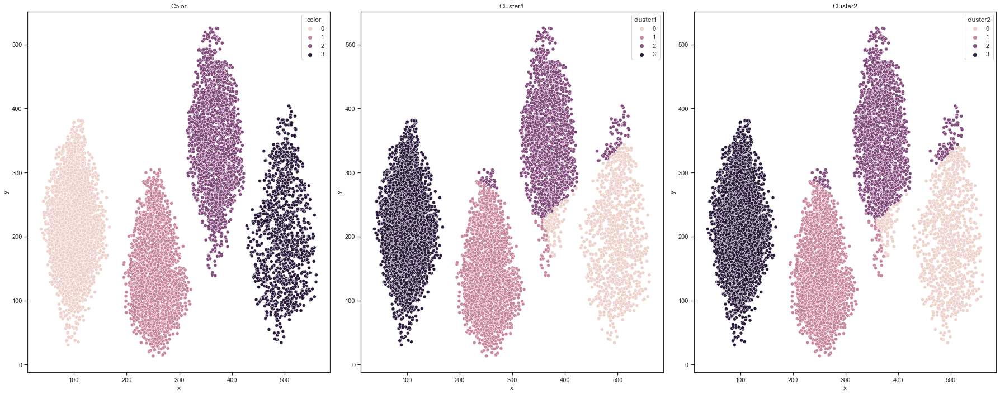

In [26]:
plot_clustering("basic1", 4)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.4670415948654753
Cluster Sklearn: 0.4671211110370058
Cluster nativo 0.46647113711803156
Davies-Bouldin:
Color: 0.863005042040745
Cluster Sklearn: 0.8655287841980766
Cluster nativo 0.8668395014418738
Calinski-Harabasz:
Color: 16988.284003171135
Cluster Sklearn: 17017.392937979374
Cluster nativo 16999.384490133518


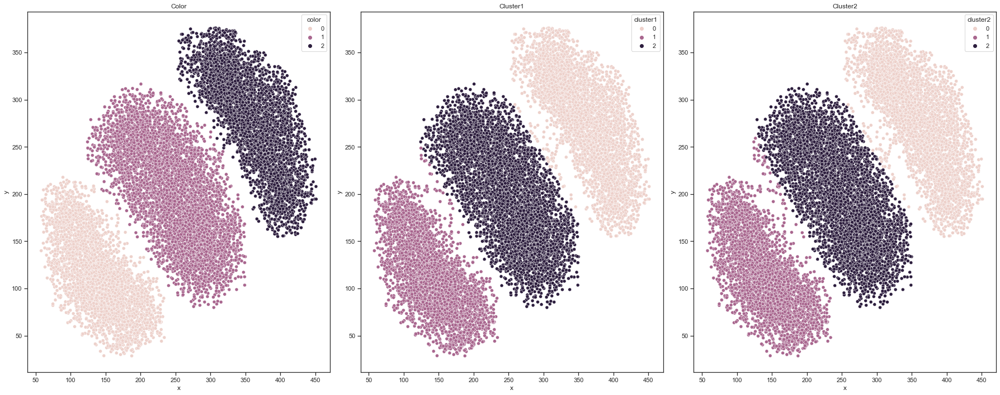

In [27]:
plot_clustering("basic4", 3)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.7086648772316748
Cluster Sklearn: 0.7087884928168264
Cluster nativo 0.7087884928168264
Davies-Bouldin:
Color: 0.4086946803848604
Cluster Sklearn: 0.408445458584707
Cluster nativo 0.408445458584707
Calinski-Harabasz:
Color: 14881.511905685964
Cluster Sklearn: 14887.602092417328
Cluster nativo 14887.602092417328


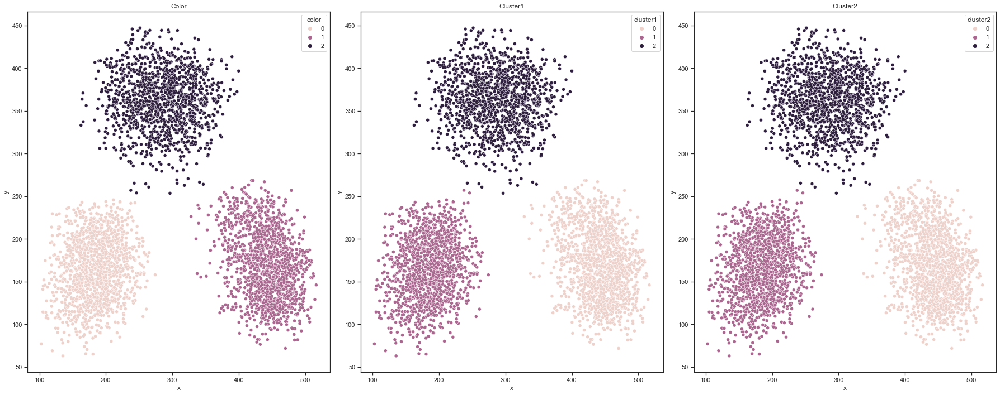

In [28]:
plot_clustering("basic5", 3)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.45470941484633426
Cluster Sklearn: 0.470627284561713
Cluster nativo 0.4707309055773511
Davies-Bouldin:
Color: 0.708673613030343
Cluster Sklearn: 0.6903688939742447
Cluster nativo 0.6895775455319517
Calinski-Harabasz:
Color: 4817.328036051302
Cluster Sklearn: 5069.161595805268
Cluster nativo 5069.773767523055


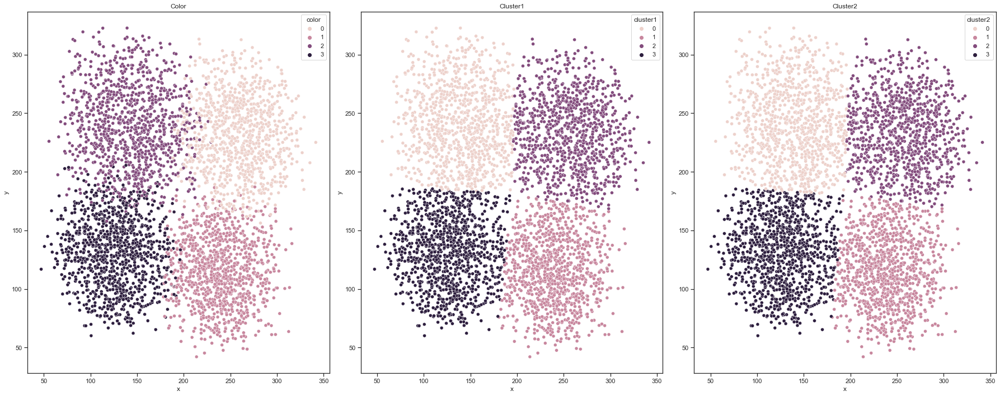

In [29]:
plot_clustering("blob", 4)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.6465156552400856
Cluster Sklearn: 0.5388329416737588
Cluster nativo 0.5415047378906468
Davies-Bouldin:
Color: 0.4400533543148168
Cluster Sklearn: 0.6494717870676092
Cluster nativo 0.6589391939792859
Calinski-Harabasz:
Color: 28284.642443328754
Cluster Sklearn: 14716.86452585787
Cluster nativo 15245.010050653598


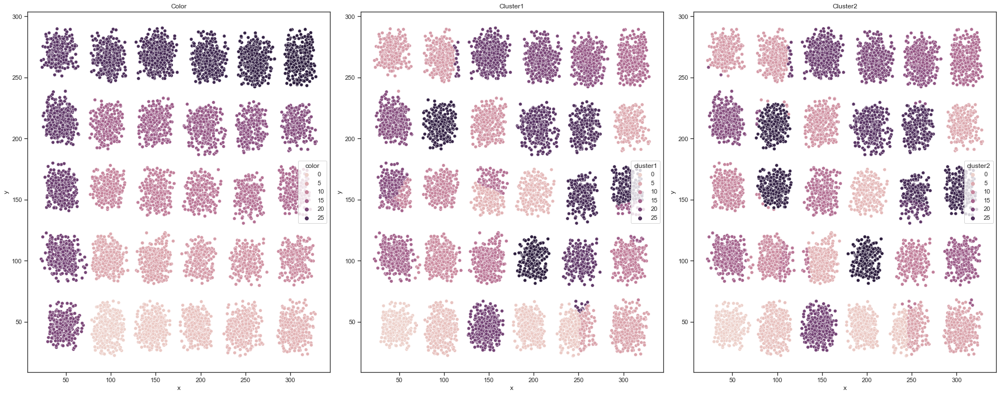

In [30]:
plot_clustering("boxes", 30)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5374000827879934
Cluster Sklearn: 0.409279829090041
Cluster nativo 0.42721490493805014
Davies-Bouldin:
Color: 0.5940890223863998
Cluster Sklearn: 0.855375164752814
Cluster nativo 0.77449270962151
Calinski-Harabasz:
Color: 34966.028200262444
Cluster Sklearn: 20644.92822297149
Cluster nativo 24115.063282002335


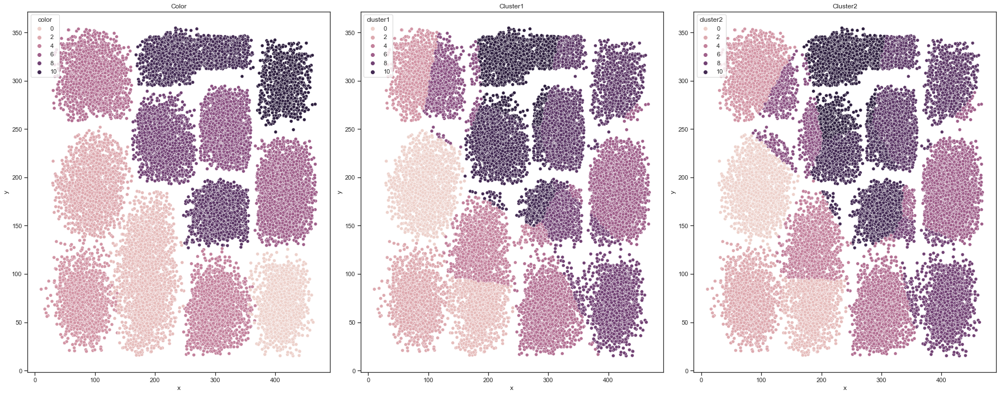

In [31]:
plot_clustering("boxes3", 12)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.7114309961278191
Cluster Sklearn: 0.7126034598377666
Cluster nativo 0.7126034598377666
Davies-Bouldin:
Color: 0.3757538799254382
Cluster Sklearn: 0.37231781163318506
Cluster nativo 0.37231781163318506
Calinski-Harabasz:
Color: 9692.778785946037
Cluster Sklearn: 9787.49794235303
Cluster nativo 9787.49794235303


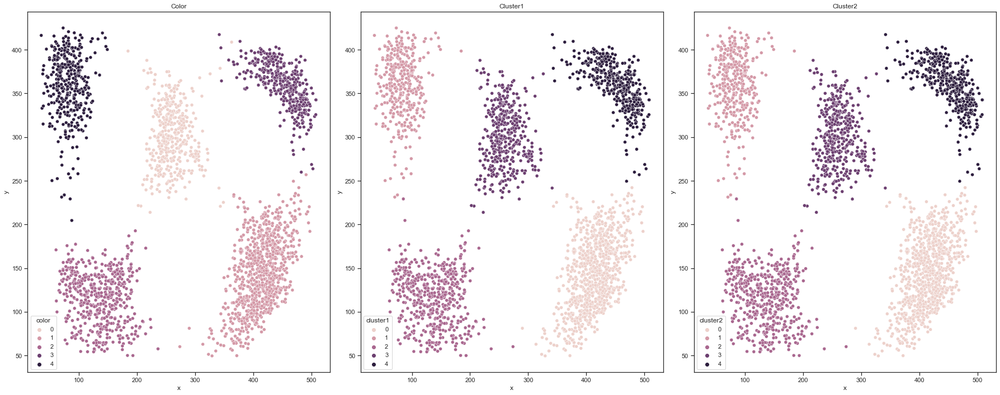

In [32]:
plot_clustering("network", 5)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.6128255623301866
Cluster Sklearn: 0.6128255623301866
Cluster nativo 0.6128255623301866
Davies-Bouldin:
Color: 0.5436091676015101
Cluster Sklearn: 0.5436091676015101
Cluster nativo 0.5436091676015101
Calinski-Harabasz:
Color: 945.686103172692
Cluster Sklearn: 945.686103172692
Cluster nativo 945.686103172692


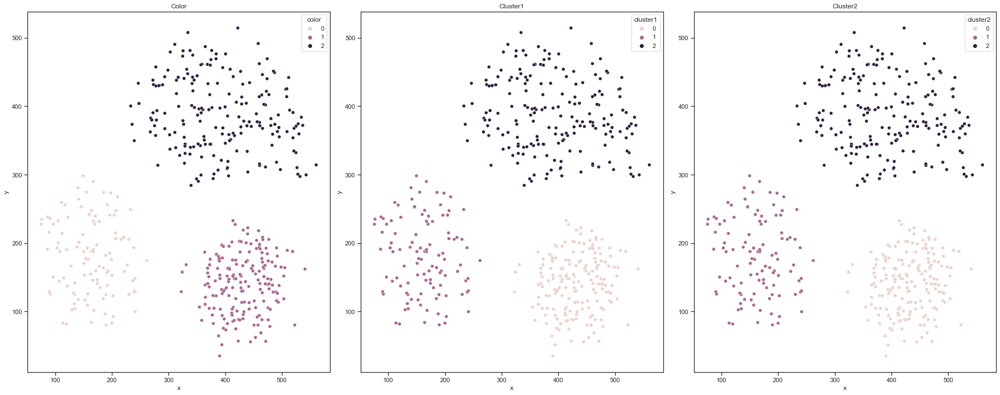

In [33]:
plot_clustering("sparse", 3)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5193736396508104
Cluster Sklearn: 0.5190859235172718
Cluster nativo 0.5192883838275183
Davies-Bouldin:
Color: 0.7315914236355435
Cluster Sklearn: 0.7242765541176374
Cluster nativo 0.7197971393838539
Calinski-Harabasz:
Color: 3122.3724301315324
Cluster Sklearn: 3253.950273490561
Cluster nativo 3279.897454402634


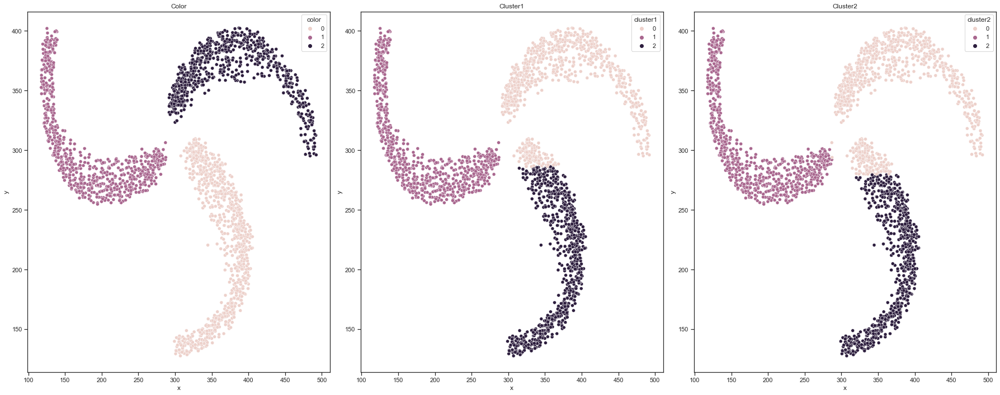

In [34]:
plot_clustering("spirals", 3)

c:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1804: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.4445730060107293
Cluster Sklearn: 0.31764308645310574
Cluster nativo 0.44337759120140935
Davies-Bouldin:
Color: 0.776418796483771
Cluster Sklearn: 0.9293523805548636
Cluster nativo 0.7806055558930727
Calinski-Harabasz:
Color: 10581.341427150237
Cluster Sklearn: 7392.243655142698
Cluster nativo 10575.576707764054


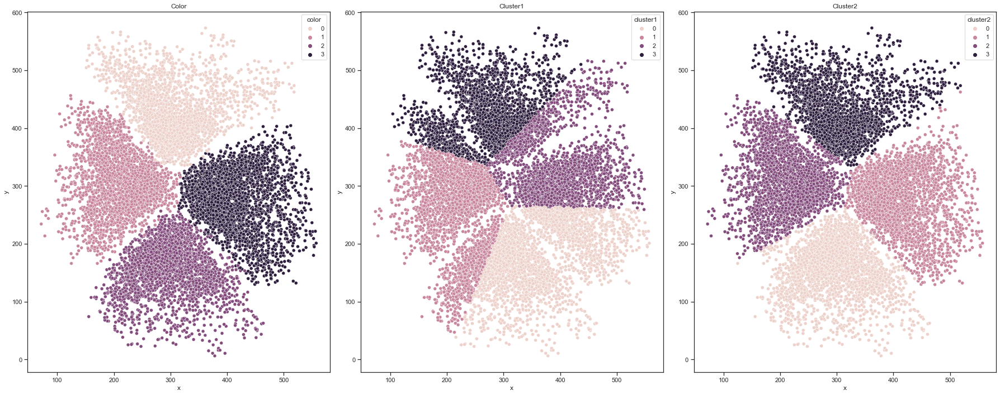

In [35]:
plot_clustering("supernova", 4)